<a href="https://colab.research.google.com/github/jvataidee/pdi_python/blob/main/PCA_Tranformacoes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PCA e Transformacoes**

### Instalar bibliotecas

In [ ]:
!pip install spectral
!pip install rasterio

### importar bibliotecas

In [235]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from spectral import imshow
import seaborn as sns
import matplotlib.image as mpimg
import tifffile as tif
from spectral import *
import rasterio as rio
import cv2

from scipy.signal import convolve

## **Principais Componentes**

In [ ]:
with rio.open('/content/drive/MyDrive/pdi_python/21 - PDI com Python/01 - Pré-Processamento/L71221071_07120010720_DN.tif') as src:
  b1 = src.read(1)
  b2 = src.read(2)
  b3 = src.read(3)
  b4 = src.read(4)
  b5 = src.read(5)
  b7 = src.read(6)

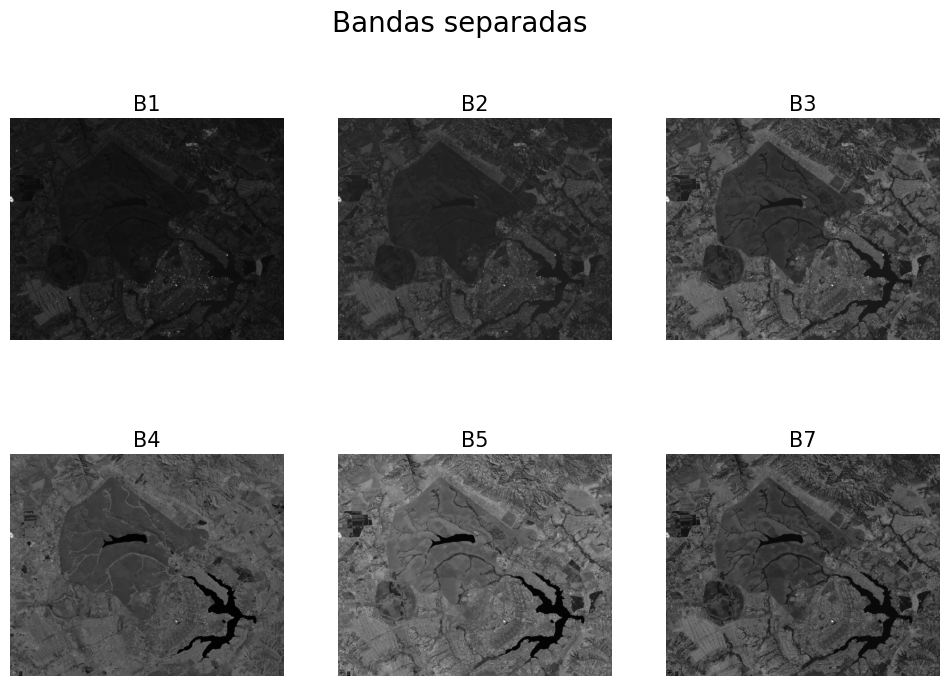

In [100]:
bandas = ['B1','B2','B3','B4','B5','B7']
bands_img = [b1, b2, b3, b4, b5, b7]

fig,axes = plt.subplots(2,3,figsize=(12,8),sharex='all', sharey='all')
fig.suptitle('Bandas separadas', fontsize=20)
axes = axes.ravel()
for i in range(6):
  axes[i].imshow(bands_img[i],cmap='Greys_r')
  axes[i].set_title(bandas[i],fontsize=15)
  axes[i].axis('off')

In [192]:
image = np.stack((b1, b2, b3, b4, b5, b7), axis=-1)
image.shape

(1233, 1520, 6)

In [193]:
def calcular_autoval_autovec(img):
    # Cria uma matriz de zeros com o tamanho adequado
    Matriz = np.zeros((img[:,:,0].size, 6))

    # Transformando as imagens em vetores de 1-dimensão
    for i in range(6):
        vetor = img[:,:,i].flatten()  # Função que transforma a matriz em vetor 1D
        Matriz[:,i] = vetor

    # Calculando a matriz de covariância entre as bandas
    cov = np.cov(Matriz.transpose())

    # Calculando a matriz de correlação entre as bandas
    corr = np.corrcoef(Matriz.transpose())

    # Calculando os autovalores e autovetores da matriz de covariância
    autoval, autovec = np.linalg.eig(cov)

    # Ordenando os autovalores e autovetores em ordem decrescente
    ord = autoval.argsort()[::-1]  # Função que retorna os índices para ordenar um array
    autoval = autoval[ord]
    autovec = autovec[:,ord]

    # Retornando os autovalores e autovetores
    return autoval, autovec, Matriz

In [194]:
resultado = calcular_autoval_autovec(image)

#carregando resultados
Matriz = resultado[2]
autoval = resultado[0]
autovec = resultado[1]

In [195]:
PC = np.matmul(Matriz,autovec)
PC_nome = ['PC1','PC2','PC3','PC4','PC5','PC6']

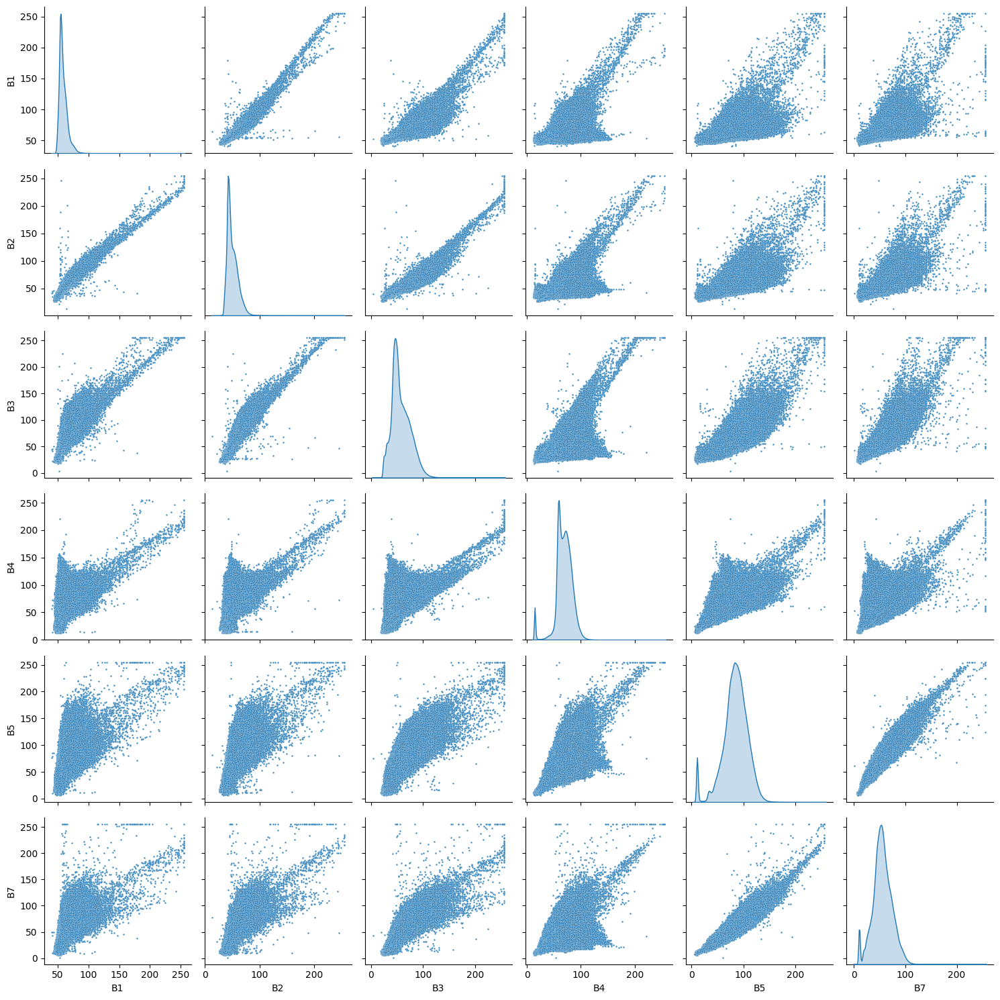

In [198]:
# Criando um DataFrame para a matriz de bandas
bd = pd.DataFrame(Matriz, columns=bandas)

# Criando um DataFrame para os principais componentes
pc = pd.DataFrame(PC, columns=PC_nome)

# Plotando a matriz de bandas
bandas_plot = sns.pairplot(bd, diag_kind='kde', plot_kws={"s": 3})

# Configurando a organização dos plots
plt.tight_layout()
plt.show()

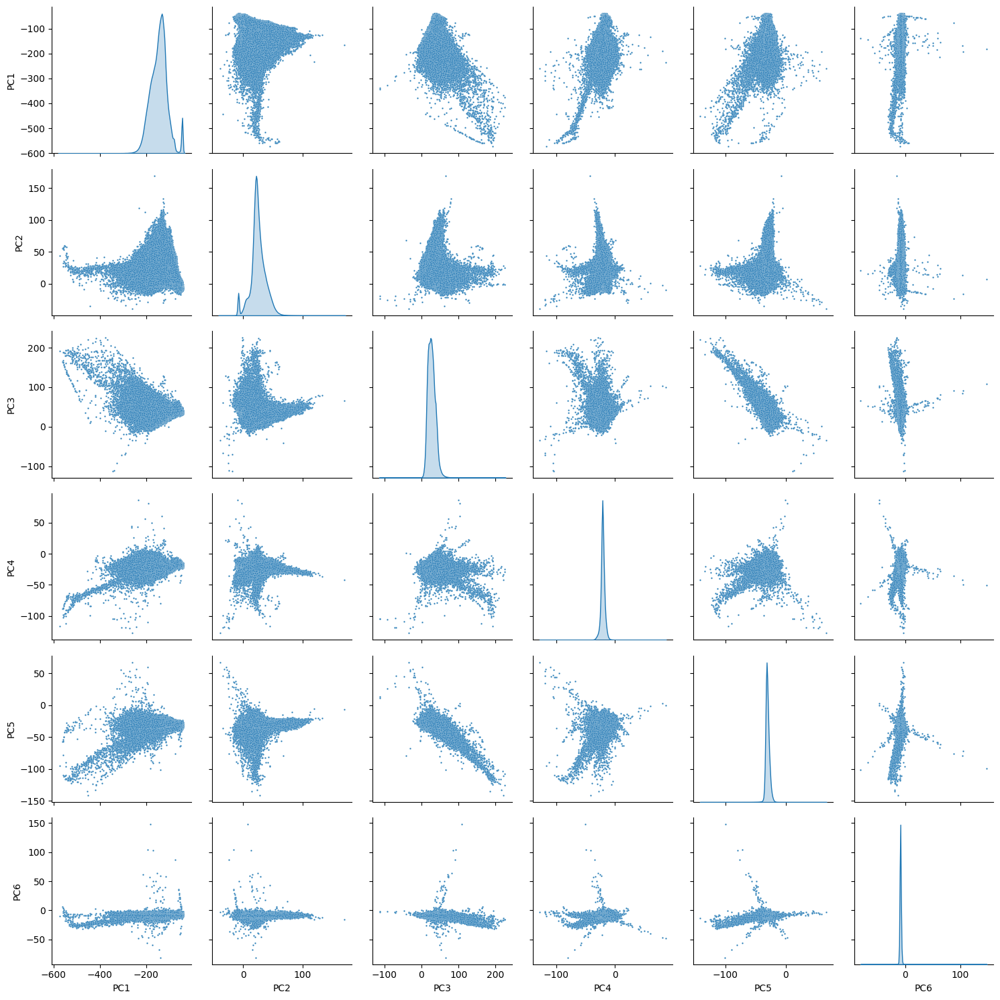

In [199]:
# Plotando os principais componentes
pc_plot = sns.pairplot(pc, diag_kind='kde', plot_kws={"s": 3})

# Configurando a organização dos plots
plt.tight_layout()
plt.show()

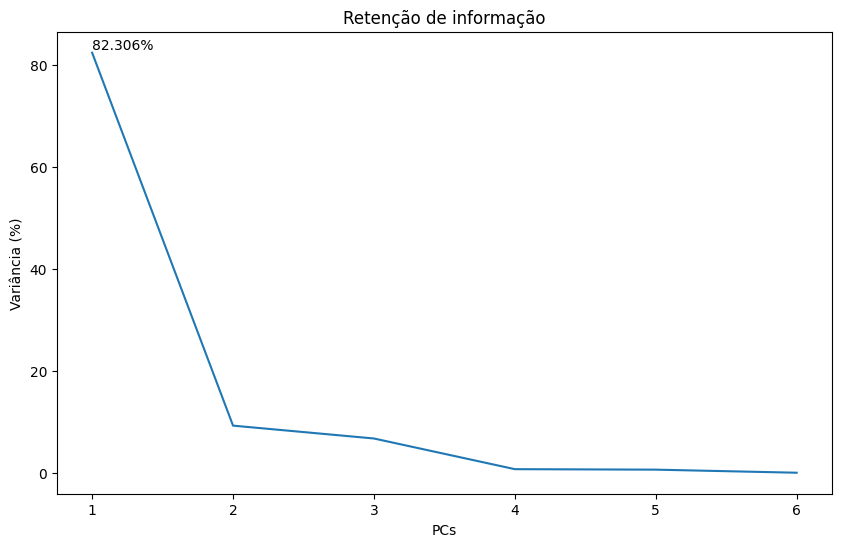

In [200]:
np.set_printoptions(suppress=True)

# Calculando a porcentagem de variância de cada componente principal
var = autoval / sum(autoval) * 100

# Configurando o gráfico
plt.figure(figsize=(10, 6))
plt.plot([1, 2, 3, 4, 5, 6], var)

# Adicionando anotação com a maior porcentagem de variância
plt.annotate(round(var.max(), 3).astype(str) + '%', xy=(1, 83))

# Configurando os rótulos dos eixos e título do gráfico
plt.ylabel('Variância (%)')
plt.xlabel('PCs')
plt.title('Retenção de informação')

# Exibindo o gráfico
plt.show()

In [201]:
PC_2D = np.zeros((image.shape[0],image.shape[1],6))
for i in range(6):
    PC_2D[:,:,i] = PC[:,i].reshape(-1,image.shape[1])

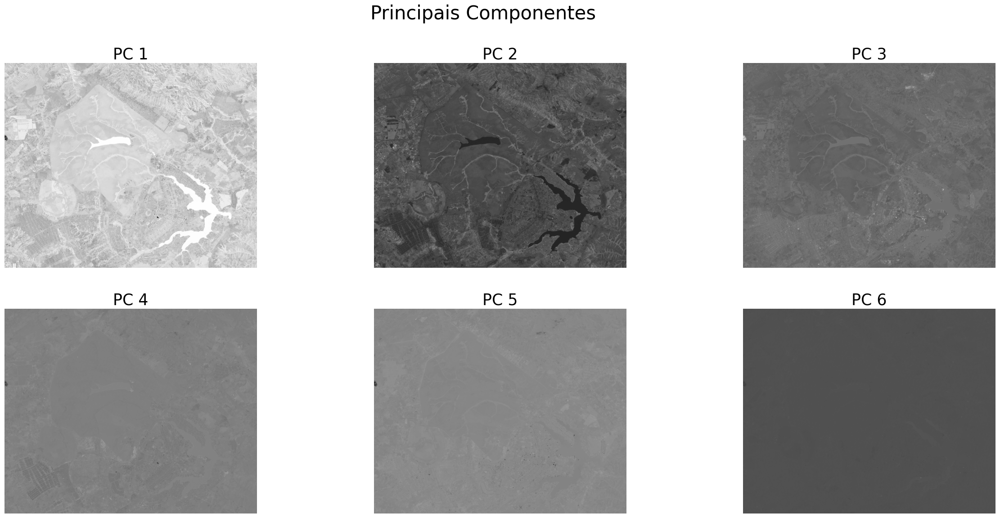

In [202]:
#Plotando as PCs separadamente
fig,axes = plt.subplots(2,3,figsize=(30,13),sharex='all', sharey='all')
fig.suptitle('Principais Componentes', fontsize=30)


axes = axes.ravel()
for i in range(6):
    axes[i].imshow(PC_2D[:,:,i],cmap='gray')
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')

In [203]:
# Crianco pc
pc = principal_components(image)

# Reduzindo dimensionalidade (99%)
pc99 = pc.reduce(fraction=0.99)

# Rodando principal components
img_pc = pc99.transform(image)

In [204]:
img_pc.shape

(1233, 1520, 4)

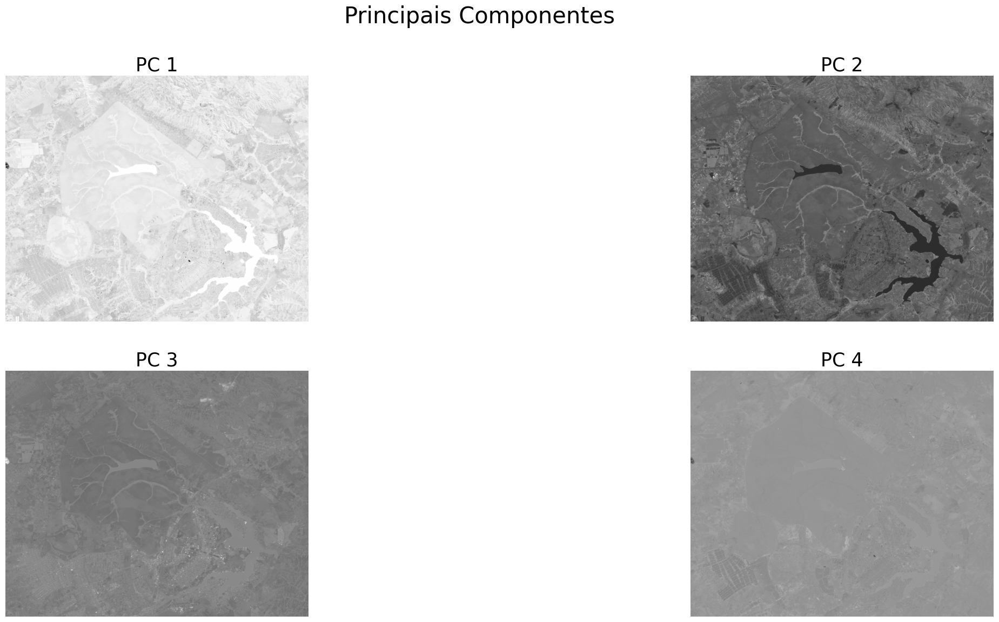

In [169]:
# Visualizando componentes
fig,axes = plt.subplots(2,2,figsize=(30,13),sharex='all', sharey='all')
fig.suptitle('Principais Componentes', fontsize=30)
axes = axes.ravel()
for i in range(4):
    axes[i].imshow(img_pc[:,:,i],cmap='Greys_r')
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')

/usr/local/lib/python3.10/dist-packages/spectral/graphics/spypylab.py:796: UserWarning: Failed to create RectangleSelector object. Interactive pixel class labeling will be unavailable.
  warnings.warn(msg)


ImageView object:
  Display bands       :  (1, 2, 3)
  Interpolation       :  <default>
  RGB data limits     :
    R: [-32.20200334627469, 26.837591831251682]
    G: [-16.847453642509375, 22.792170065042523]
    B: [-8.223778789373105, 7.631498454985899]

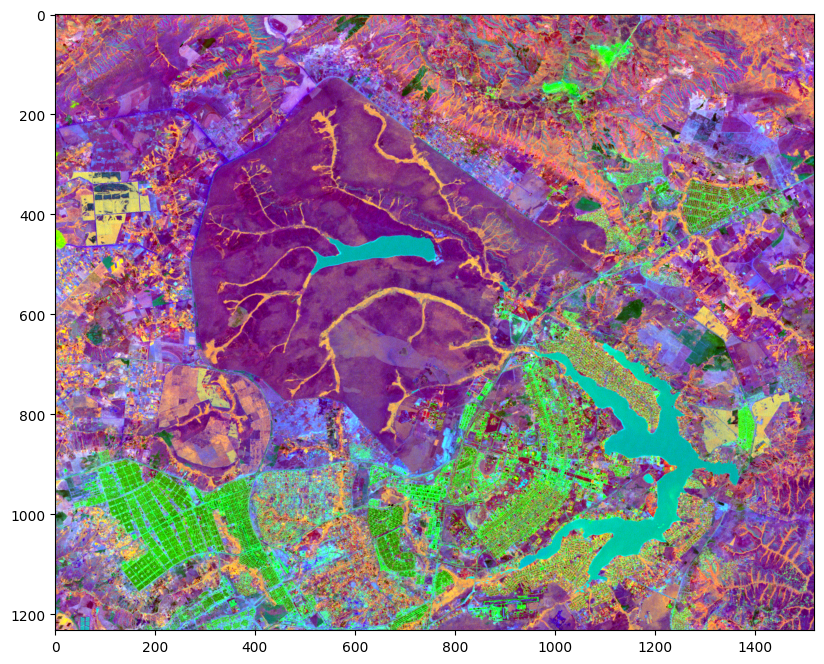

In [170]:
# Visualizando composição colorida
imshow(img_pc,(1,2,3), stretch=(0.02,0.98), figsize=(12,8))

## **Transformações Espaciais**

In [224]:
def expansao(img, percent_min=2, percent_max=98):
    # Cria uma matriz de zeros com o mesmo formato da imagem de entrada
    img2 = np.zeros_like(img)

    # Define os valores mínimo e máximo para expansão
    x, y = 0, 255

    # Calcula os percentis mínimo e máximo da imagem
    pmin = np.percentile(img, percent_min)
    pmax = np.percentile(img, percent_max)

    # Realiza a expansão linear da imagem utilizando os valores mínimo e máximo
    f = x + (img - pmin) * (y - x) / (pmax - pmin)

    # Limita os valores resultantes aos limites mínimo e máximo
    f[f < x] = x
    f[f > y] = y

    # Atribui os valores resultantes à imagem de saída
    img2 = f

    # Retorna a imagem de saída
    return img2

In [245]:
# NDVI
ndvi = (b4 - b3) / (b4 + b3)
ndvi = expansao(ndvi[800:1200,0:400])

<ipython-input-245-0fa507c09ac7>:2: RuntimeWarning: divide by zero encountered in true_divide
  ndvi = (b4 - b3) / (b4 + b3)


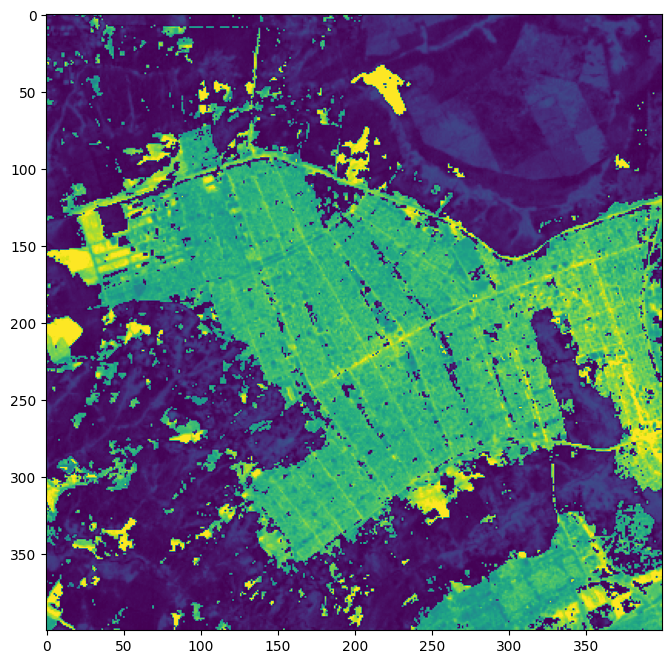

In [226]:
plt.figure(figsize = (12,8))
plt.imshow(ndvi);

In [ ]:
# Criando filtros
kernel1 = np.matrix([[1,1,1],[1,1,1],[1,1,1]])
kernel2 = np.matrix([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
kernel3 = np.ones((13,13), np.float)

In [228]:
# Aplicando filtros
filtro1 = cv2.filter2D(ndvi, -1, kernel1)
filtro2 = cv2.filter2D(ndvi, -1, kernel2)
filtro3 = cv2.filter2D(ndvi, -1, kernel3)

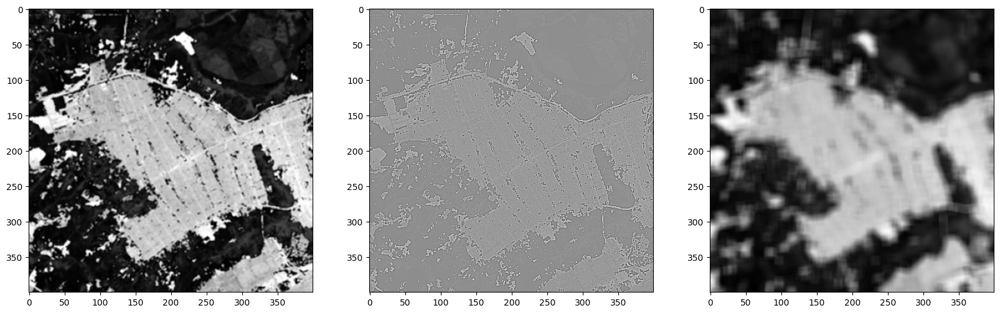

In [243]:
plt.figure(figsize = (20,8))
plt.subplot(131)
plt.imshow(filtro1, cmap='Greys_r')
plt.subplot(132)
plt.imshow(filtro2, cmap='Greys_r')
plt.subplot(133)
plt.imshow(filtro3, cmap='Greys_r');

In [246]:
blur = cv2.blur(ndvi, (7,7))
gblur =cv2.GaussianBlur(ndvi, (9,9),0)

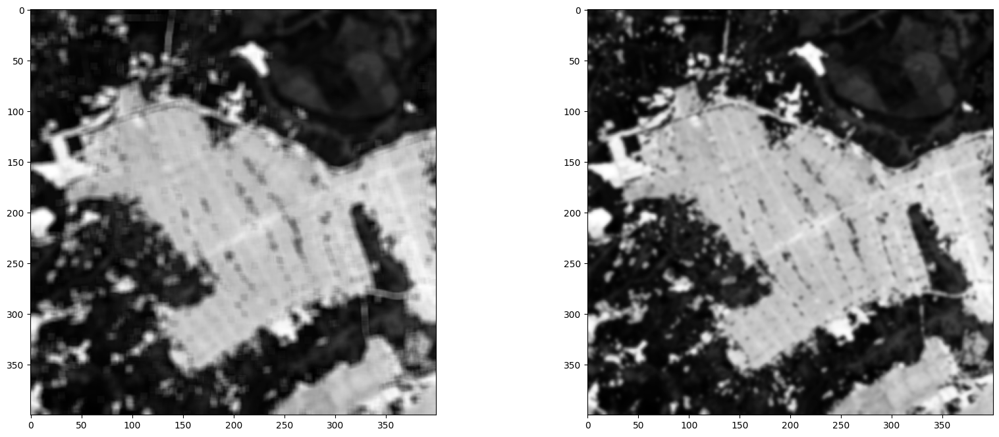

In [247]:
plt.figure(figsize = (20,8))
plt.subplot(121)
plt.imshow(blur, cmap='Greys_r')
plt.subplot(122)
plt.imshow(gblur, cmap='Greys_r');

In [248]:
# Aplicando filtros de sobel
sobelx = cv2.Sobel(src=ndvi, ddepth=-1, dx=1,dy=0, ksize=5)
sobely = cv2.Sobel(src=ndvi, ddepth=-1, dx=0,dy=1, ksize=5)

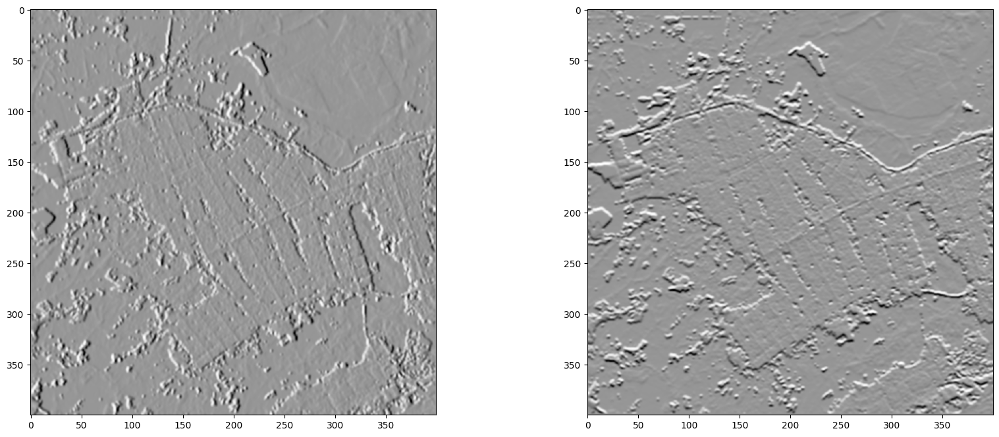

In [249]:
plt.figure(figsize = (20,8))
plt.subplot(121)
plt.imshow(sobelx, cmap='Greys_r')
plt.subplot(122)
plt.imshow(sobely, cmap='Greys_r');

In [250]:
# Filtros com scipy
kernel4 = np.matrix([[-1,-1,-1],[-1,5,-1],[-1,-1,-1]])
filtro_scipy = convolve(ndvi, kernel4, mode='same')

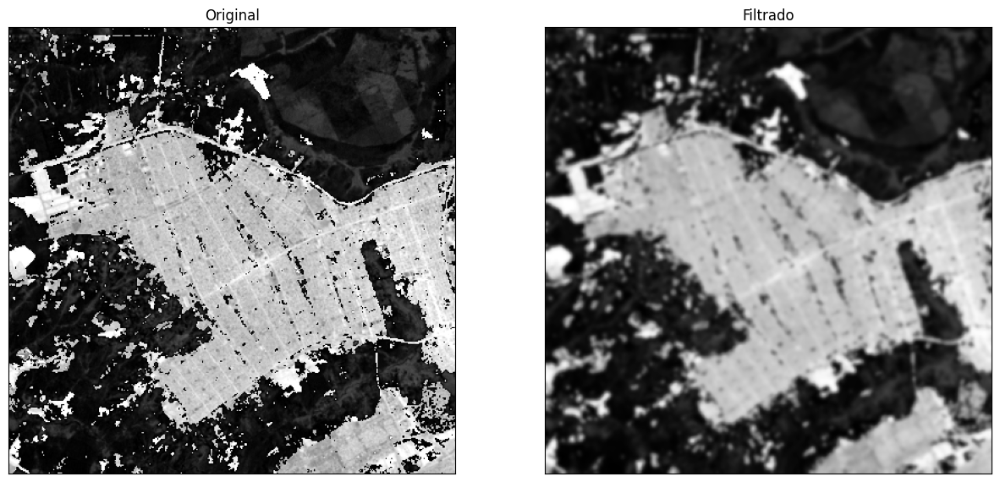

In [251]:
#Visualizando filtros
plt.figure(figsize=(15,10))
plt.subplot(121), plt.imshow(ndvi, cmap='Greys_r'), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gblur, cmap='Greys_r'), plt.title('Filtrado')
plt.xticks([]), plt.yticks([])
plt.show()